# Instrument-to-Instrument translation

ITI provides translations between image domains of solar instruments (image enhancement, super-resolution, cross-calibration, estimation of observables). This notebook gives six examples of ITI translation.

Colab offers free online computation power. The runtime type can be changed to speed up the translations (Runtime -> Change runtime type -> Hardware accelerator -> GPU). Custom observations can be enhanced by replacing the download URLs or uploading your own files. For the translation of larger data sets consider installing ITI on your local environment: `conda install iti -c conda-forge`

In [ ]:
!pip install git+https://github.com/RobertJaro/InstrumentToInstrument.git

In [4]:
import glob
import os

import numpy as np

from iti.download.download_hmi_continuum import HMIContinuumDownloader
from iti.translate import *
from urllib.request import urlretrieve

from matplotlib import pyplot as plt
from datetime import datetime

from astropy import units as u
from astropy.coordinates import SkyCoord
import warnings
warnings.filterwarnings('ignore')
os.makedirs('samples')

# HMI-to-Hinode continuum

Here we super-resolve HMI observations with 4096x4096 pixels by a factor 4. The model was trained with observations from Hinode/SOT to infer the resolution increase.

We start by downloading FITS files from SDO/HMI continuum. ITI provides a download routines for multiple data sets, here we utilize the `HMIContinuumDownloader`. We download an observation from 2021-09-09.

In [3]:
fetcher = HMIContinuumDownloader(ds_path='hmi', num_worker_threads=4)
hmi_files = fetcher.fetchDates([datetime(2021, 9, 9, 15)])
print('downloaded:', hmi_files)

INFO:root:Fetch header information
INFO:numexpr.utils:NumExpr defaulting to 2 threads.
INFO:root:Download data


downloaded: ['hmi/6173/2021-09-09T15:00:00.fits']


For later comparison we load the HMI FITS file as SunPy Map.

In [4]:
hmi_map = Map(hmi_files[0])
hmi_map.data[np.isnan(hmi_map.data)] = 0

The translator classes are the core element of the ITI translation. They follow the notation: `InstrumentAToInstrumentB`. For HMI files we need to translate the image in patches (patch_factor=3), otherwise we would exceed the memory.

The first initialization of each translator triggers the download of the pre-trained model and stores it locally for later use. 

In [5]:
translator = HMIToHinode(patch_factor=3)

The translate function starts the translation process of the HMI FITS files and returns a genartor object. This can be used to sequentially process the results. Here we only translate a single file and convert the generator object to a `list`.

In [6]:
iti_hmi_map = list(translator.translate(hmi_files))[0]

The result of the ITI translation is a SunPy map that stores all necessary coordinate information. We can compare this map to the original HMI observation.

Text(0.5, 1.0, 'ITI')

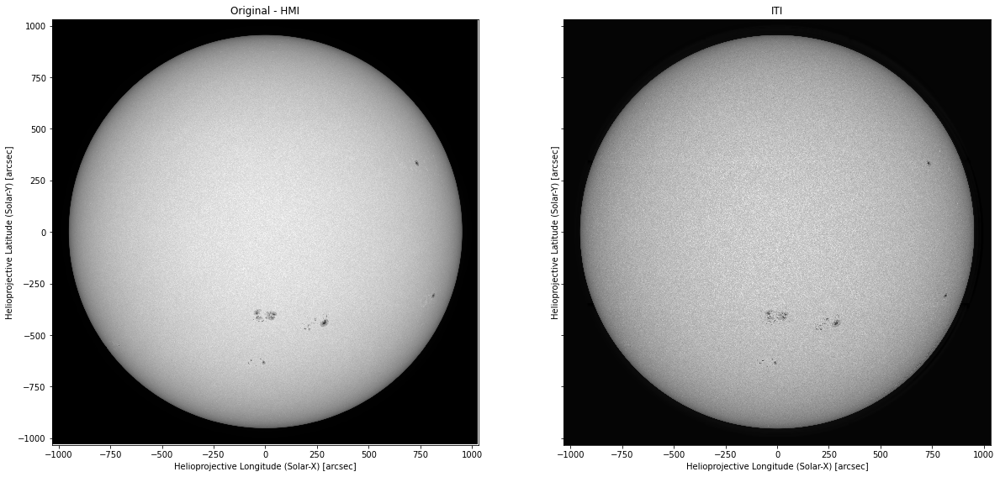

In [7]:
fig, axs = plt.subplots(1, 2, figsize=(20, 10), sharex=True, sharey=True)
hmi_map.plot(axes=axs[0])
axs[0].set_title('Original - HMI')
iti_hmi_map.plot(axes=axs[1])
axs[1].set_title('ITI')

For a comparison at smaller scales we can specify a subframe and plot the images side-by-side.

Text(0.5, 1.0, 'ITI')

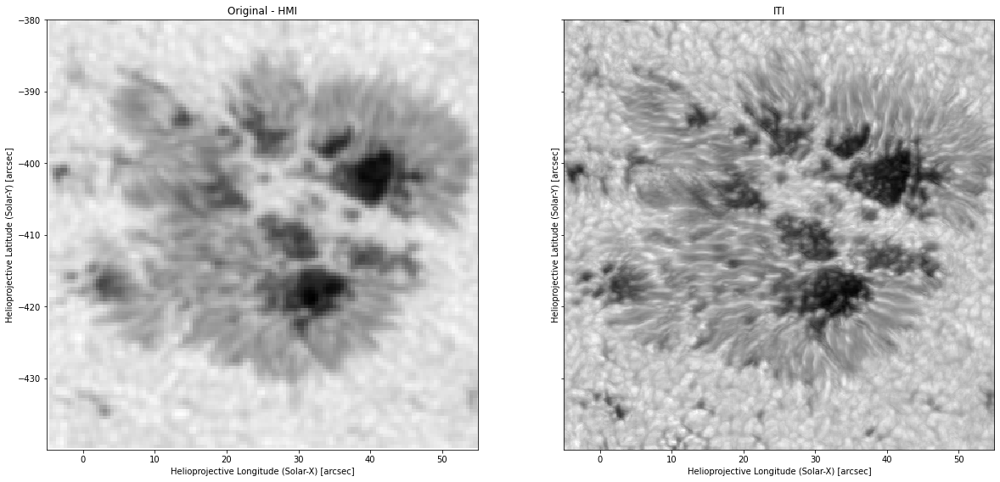

In [8]:
bl = SkyCoord(-5 * u.arcsec, -440 * u.arcsec, frame=hmi_map.coordinate_frame)
tr = SkyCoord(55 * u.arcsec, -380 * u.arcsec, frame=hmi_map.coordinate_frame)

fig, axs = plt.subplots(1, 2, figsize=(20, 10), sharex=True, sharey=True)
hmi_map.submap(bl, top_right=tr).plot(axes=axs[0])
axs[0].set_title('Original - HMI')
iti_hmi_map.submap(bl, top_right=tr).plot(axes=axs[1])
axs[1].set_title('ITI')

# Download samples

SOHO and EIT files requires a pre-processing that is only available in SSWIDL. We provide a sample observation from each Instrument. If you want to make use of custom files, use the prep routines and upload your files.

In [9]:
samples_zip_path = 'samples.zip'
urlretrieve('http://kanzelhohe.uni-graz.at/iti/samples.zip', samples_zip_path)
shutil.unpack_archive(samples_zip_path, 'samples')

# SOHO-to-SDO EUV

For the translation of SOHO/EIT observations we make use of the multi-channel representation and translate all four EUV channels simultaneous. For this application we use half of the SDO resolution as reference for our enchancement.

We load the previously downloaded SOHO files. The translator requires a list of the four aligned FITS files for each translation.

In [10]:
soho_files = sorted(glob.glob('samples/soho/**/*.fits', recursive=True))
soho_maps = [Map(f).rotate() for f in soho_files] # rotate north up

translator = SOHOToSDOEUV()
iti_soho_maps = list(translator.translate([[f] for f in soho_files]))[0]


We compare the SunPy Maps with the default plot settings.

Text(0.5, 1.0, 'ITI')

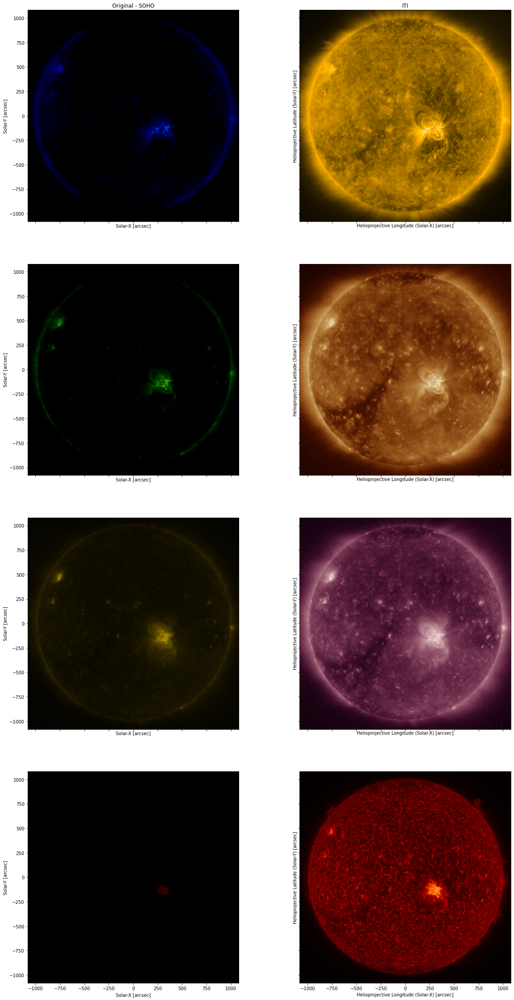

In [11]:
fig, axs = plt.subplots(4, 2, figsize=(20, 40), sharey=True, sharex=True)
for i, (soho_map, iti_soho_map) in enumerate(zip(soho_maps, iti_soho_maps)):
    soho_map.plot(axes=axs[i,0])
    iti_soho_map.plot(axes=axs[i,1])
[ax.set_title('') for ax in np.ravel(axs)]
axs[0,0].set_title('Original - SOHO')
axs[0,1].set_title('ITI')

The instruments have a different default colormap and scaling. For the comparison of the active region close to the center, we use the SDO colormaps and normalization (`asinh`).

Text(0.5, 1.0, 'ITI')

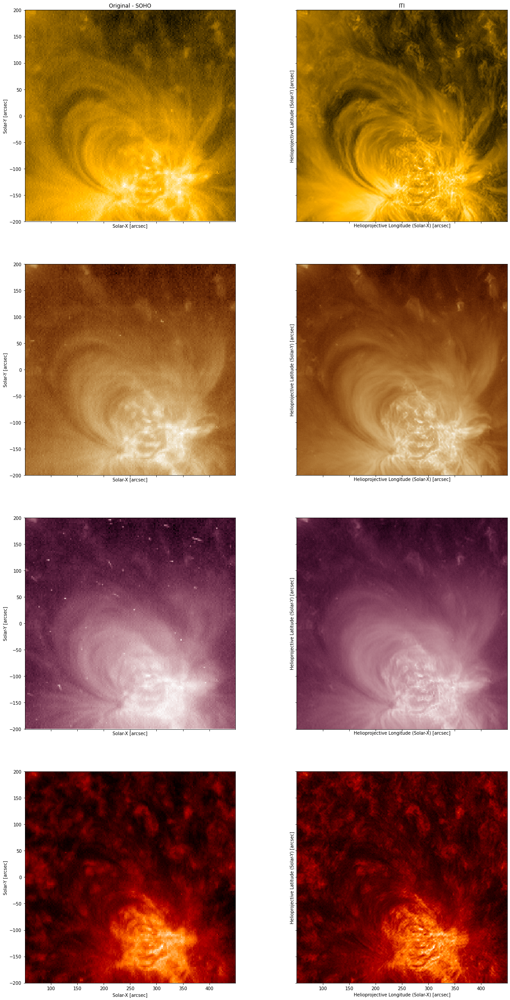

In [12]:
bl = SkyCoord(50 * u.arcsec, -200 * u.arcsec, frame=soho_maps[0].coordinate_frame)
tr = SkyCoord(450 * u.arcsec, 200 * u.arcsec, frame=soho_maps[0].coordinate_frame)

fig, axs = plt.subplots(4, 2, figsize=(20, 40), sharey=True, sharex=True)
for i, (soho_map, iti_map) in enumerate(zip(soho_maps, iti_soho_maps)):
    soho_map.submap(bl, top_right=tr).plot(axes=axs[i,0], **iti_map.plot_settings)
    iti_map.submap(bl, top_right=tr).plot(axes=axs[i,1], **iti_map.plot_settings)
[ax.set_title('') for ax in np.ravel(axs)]
axs[0,0].set_title('Original - SOHO')
axs[0,1].set_title('ITI')

# STEREO-to-SDO

STEREO provides a better resolution than SOHO. For this application we consider the full 4096x4096 pixel resolution of SDO as our reference.

In [13]:
stereo_files = sorted(glob.glob('samples/stereo/**/*.fits', recursive=True))
stereo_maps = [Map(f).rotate() for f in stereo_files] # rotate north up

translator = STEREOToSDO()
iti_stereo_maps = list(translator.translate([[f] for f in stereo_files]))[0]


We again compare the full-disk SunPy maps against each other.

Text(0.5, 1.0, 'ITI')

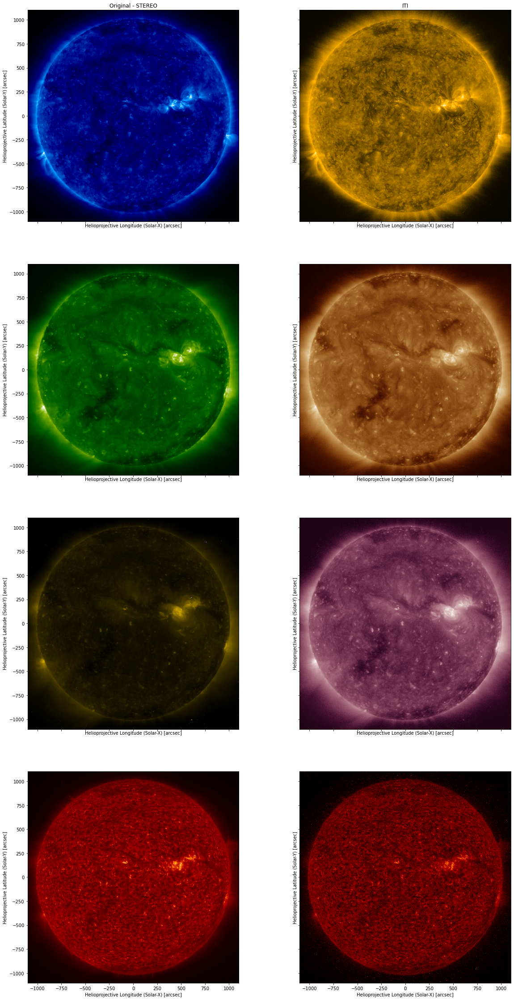

In [14]:
fig, axs = plt.subplots(4, 2, figsize=(20, 40), sharex=True, sharey=True)
for i, (stereo_map, iti_map) in enumerate(zip(stereo_maps, iti_stereo_maps)):
    stereo_map.plot(axes=axs[i,0])
    iti_map.plot(axes=axs[i,1])
[ax.set_title('') for ax in np.ravel(axs)]
axs[0,0].set_title('Original - STEREO')
axs[0,1].set_title('ITI')

The full-disk images show that the value scaling is adjusted by ITI to correspond to SDO observations. Next, we investigate the enhancement at smaller scales.  

Text(0.5, 1.0, 'ITI')

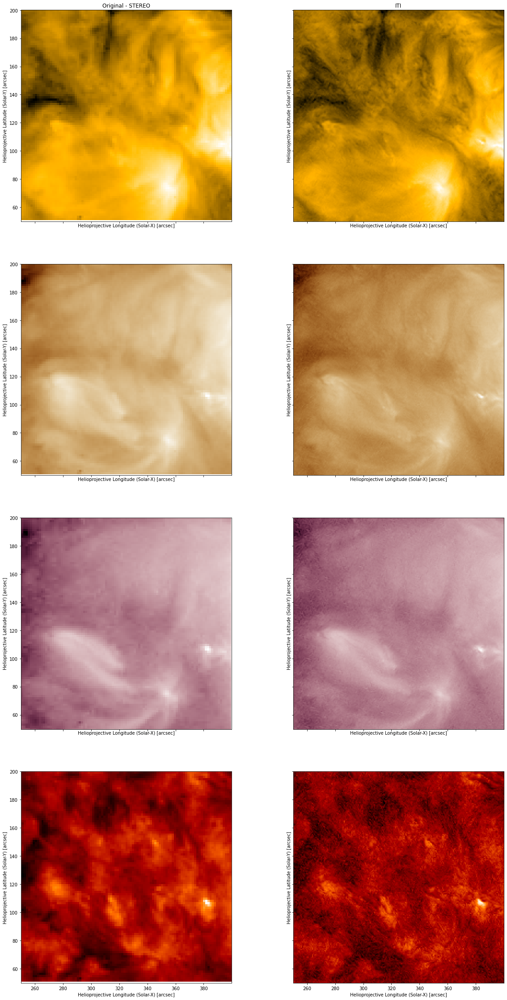

In [15]:
bl = SkyCoord(250 * u.arcsec, 50 * u.arcsec, frame=iti_stereo_maps[0].coordinate_frame)
tr = SkyCoord(400 * u.arcsec, 200 * u.arcsec, frame=iti_stereo_maps[0].coordinate_frame)

fig, axs = plt.subplots(4, 2, figsize=(20, 40), sharey=True, sharex=True)
for i, (stereo_map, iti_map) in enumerate(zip(stereo_maps, iti_stereo_maps)):
    stereo_map.submap(bl, top_right=tr).plot(axes=axs[i,0], **iti_map.plot_settings)
    iti_map.submap(bl, top_right=tr).plot(axes=axs[i,1], **iti_map.plot_settings)
[ax.set_title('') for ax in np.ravel(axs)]
axs[0,0].set_title('Original - STEREO')
axs[0,1].set_title('ITI')

# KSO low-to-high

The Kanzelhohe Solar Observatory provides ground-based Halpha observations at high-cadence. The effect of atmospheric degradations can be mitiageted by ITI.

We select a random observation with quality degradataions from the KSO data archive.

In [5]:
kso_path = 'samples/kso.fits'
urlretrieve('http://cesar.kso.ac.at/halpha3a/2013/20130111/processed/kanz_halph_fi_20130111_084223.fts.gz', kso_path)

('samples/kso.fits', <http.client.HTTPMessage at 0x7f845367bc10>)

In [6]:
translator = KSOLowToHigh()

For ground-based observations we first apply a correction of the center-to-limb varaition. 

In order to compare the pre-processed observations to the ITI enhanced observations we can request the numpy arrays by setting `return_arrays=True`.

In [7]:
(_, kso, iti_kso) = list(translator.translate([kso_path], return_arrays=True))[0]

We assert the correction of the extended cloud at full-disk level.

Text(0.5, 1.0, 'ITI')

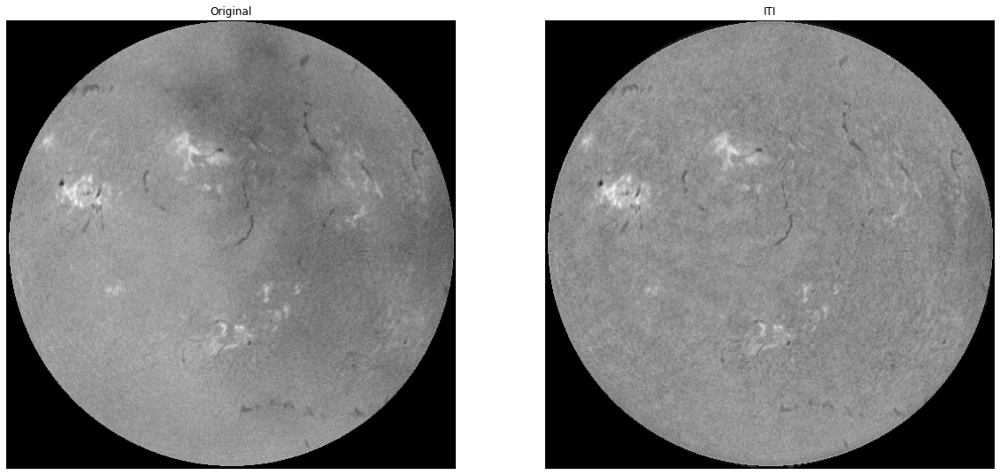

In [8]:
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
axs[0].imshow(kso[0], cmap='gray', origin='lower', )
axs[0].set_axis_off()
axs[0].set_title('Original')
axs[1].imshow(iti_kso[0], cmap='gray', origin='lower')
axs[1].set_axis_off()
axs[1].set_title('ITI')

#KSO film-to-CCD

KSO provides Halpha observations dating back to 1973. We can use ITI to restore the scanned photographic film observations in the qualtiy of the recent instrument.

We start by downloading a random observation from the archive (note that some observations are too strong degraded to recover them with ITI).

In [20]:
film_path = 'samples/film.fits'
urlretrieve('http://cesar.kso.ac.at/hafilma/1980/19800110/processed/1240457_Ha19800110_131058.fts.gz', film_path)

('samples/film.fits', <http.client.HTTPMessage at 0x7f21e1464690>)

In [21]:
translator = KSOFilmToCCD()
(_, film, iti_film) = list(translator.translate([film_path], return_arrays=True))[0]

We compare both images. Note that the solar limb is not always correctly detected, which can lead to wrong interpretations by ITI.

Text(0.5, 1.0, 'ITI')

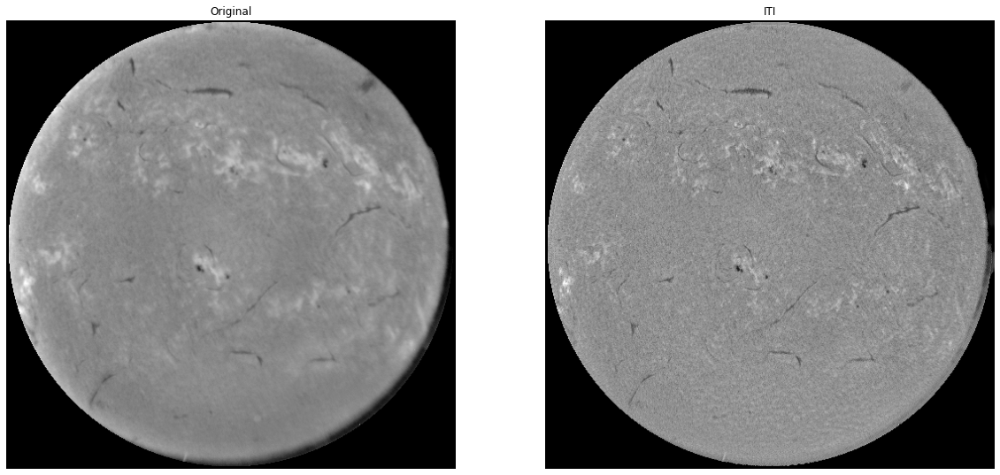

In [22]:
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
axs[0].imshow(film[0], cmap='gray', origin='lower')
axs[0].set_axis_off()
axs[0].set_title('Original')
axs[1].imshow(iti_film[0], cmap='gray', origin='lower')
axs[1].set_axis_off()
axs[1].set_title('ITI')

# STEREO - far-side magnetograms

ITI translates between image domains and can be used to approximate missing observables with the use of proxy data. In this application we estimate magnetograms from STEREO EUV filtergrams.

We only consider the absolute magnetic flux, since the magnetic polarity is arbitrary when considering local patches of EUV images.

We use the same STEREO EUV observations as for the STEREO-to-SDO application, but use the `STEREOToSDOMagnetogram` translator to also obtain the magnetograms.

In [23]:
stereo_files = sorted(glob.glob('samples/stereo/**/*.fits', recursive=True))
stereo_maps = [Map(f).rotate() for f in stereo_files] # rotate north up

In [24]:
translator = STEREOToSDOMagnetogram()
iti_mag_maps = list(translator.translate([[f] for f in stereo_files]))[0]

Text(0.5, 1.0, 'ITI')

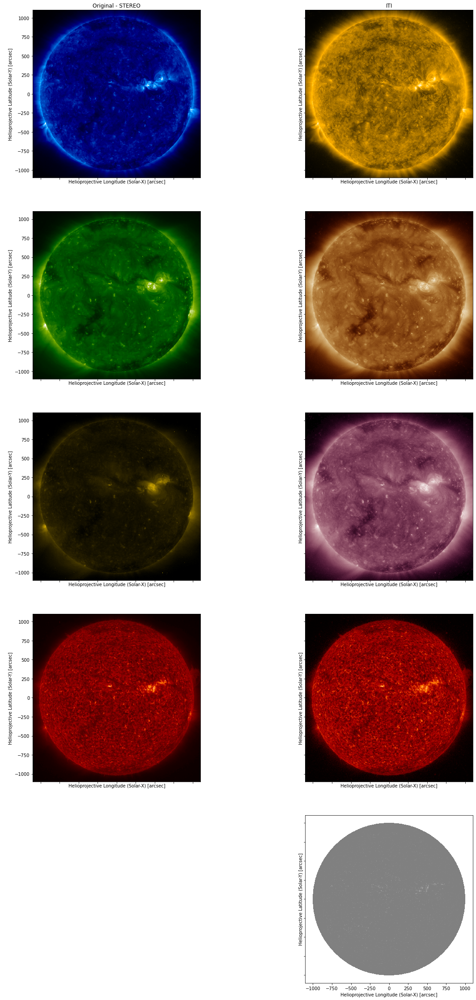

In [25]:
fig, axs = plt.subplots(5, 2, figsize=(20, 40), sharex=True, sharey=True)
for i, (stereo_map, iti_map) in enumerate(zip(stereo_maps, iti_mag_maps)):
    stereo_map.plot(axes=axs[i,0])
    iti_map.plot(axes=axs[i,1])
iti_mag_maps[-1].plot(axes=axs[-1,1], vmin=-1000, vmax=1000)
axs[-1, 0].set_axis_off()
[ax.set_title('') for ax in np.ravel(axs)]
axs[0,0].set_title('Original - STEREO')
axs[0,1].set_title('ITI')

We use the 304 AA channel as refernce to compare the estimated magntogram. We plot the magnetogram between [-1000, 1000] Gauss, such that we obtain the usual scaling of the colormap (the value range is [0, 1000]).

Text(0.5, 1.0, 'ITI - Magnetogram')

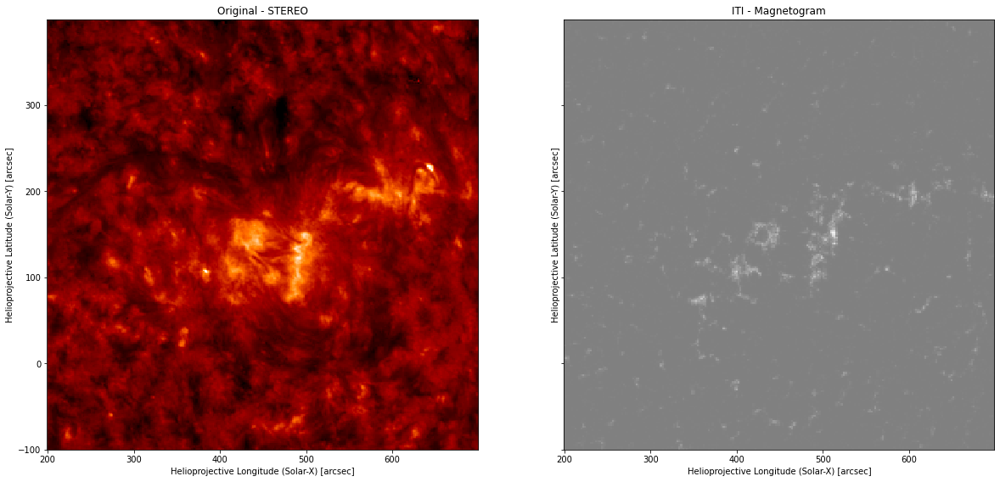

In [26]:
bl = SkyCoord(200 * u.arcsec, -100 * u.arcsec, frame=iti_mag_maps[0].coordinate_frame)
tr = SkyCoord(700 * u.arcsec, 400 * u.arcsec, frame=iti_mag_maps[0].coordinate_frame)

fig, axs = plt.subplots(1, 2, figsize=(20, 10), sharey=True, sharex=True)
stereo_maps[-1].submap(bl, top_right=tr).plot(axes=axs[0])
iti_mag_maps[-1].submap(bl, top_right=tr).plot(axes=axs[1], vmin=-1000, vmax=1000)
[ax.set_title('') for ax in np.ravel(axs)]
axs[0].set_title('Original - STEREO')
axs[1].set_title('ITI - Magnetogram')

# Large data sets

A large fraction of the computation time is due to the pre-processing of the images. The translator automatically uses CPUs for pre-processing and the GPU for the translation. When dealing with larger data sets the generator of the translate function can be used to process data sequentially (e.g., save files).

The example below creates a stream of SOHO files and plots the ITI enhanced images.

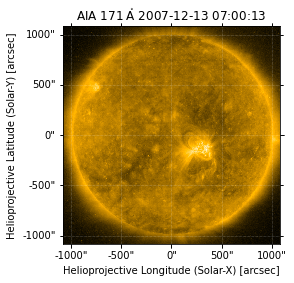

In [27]:
generator = translator.translate([[f] for f in soho_files])
for iti_map_cube in generator: # iterative translation
    iti_map_cube[0].plot() # plot first channel